# Augmented Liver Section Segmentation with U-Net 

## Setup

In [ ]:
import os

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, TensorBoard
from tensorflow.keras.backend import clear_session
from tensorflow.keras.layers import Conv2D, SeparableConv2D, Conv2DTranspose, MaxPooling2D, UpSampling2D, BatchNormalization, Activation, add
from tensorflow.keras import Model, Input
from tensorflow.keras.models import load_model

from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from packaging import version
from IPython.display import clear_output
from tensorflow.keras.optimizers import Adam
import segmentation_models as sm

from PIL import Image
from skimage.transform import resize

import optuna
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_contour
from optuna.visualization import plot_slice
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_edf

In [76]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [77]:
import tensorflow as tf
tf.__version__

'2.3.0'

In [78]:
import sklearn
sklearn.__version__

'0.24.1'

In [79]:
import skopt
skopt.__version__

'0.8.1'

In [80]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, TensorBoard
from tensorflow.keras.backend import clear_session
#import segmentation_models as sm
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from packaging import version
from IPython.display import clear_output
from tensorflow.keras.optimizers import Adam

In [81]:
# added env to solve "keras.utils' has no attribute 'generic_utils'" error
#%env SM_FRAMEWORK=tf.keras
#import segmentation_models as sm

In [82]:
try:
    import segmentation_models as sm
    print("module is installed")
except ModuleNotFoundError:
    print("SORRY")

module is installed


## Set Backbone and Define Preprocessor

In [83]:
def custom_preprocess(imgs):
    return np.interp(imgs, (imgs.min(), imgs.max()), (0,1))  #(-1, +1)) # CHANGE

preprocess_input = custom_preprocess

These 2 are some other preprocessing functions I tried and did not improve the results.

In [84]:
# extra function 1
from numpy import asarray
def custom_preprocess2(imgs):
    pixels = asarray(imgs)
    pixels = pixels.astype('float32')
    pixels /= 255.0
   
    return pixels

preprocess_input2 = custom_preprocess2

In [85]:
# extra function 2
def custom_preprocess3(imgs):
    image = tf.cast(imgs, tf.float32) / 255.0
    #image = tf.reshape(image, [-1,])
    
    return image

preprocess_input3 = custom_preprocess3

## Create Generators

In [112]:
image_datagen = ImageDataGenerator(
#    featurewise_center=False,
#    samplewise_center=True,
#    featurewise_std_normalization=True,
#    samplewise_std_normalization=True,
#    zca_whitening=True,
#    zca_epsilon=1e-06,
    rotation_range=180,
    width_shift_range=0.1,
    height_shift_range=0.1,
#    brightness_range=[0.7, 1.3],
    shear_range=10.0,
    zoom_range=[0.2, 0.3],
    fill_mode="nearest",
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input,
    validation_split=0.2)
    #samplewise_center=True, 
    #samplewise_std_normalization=True)

mask_datagen = ImageDataGenerator(
#    featurewise_center=False,
#    samplewise_center=True,
#    featurewise_std_normalization=True,
#    samplewise_std_normalization=True,
#    zca_whitening=True,
#    zca_epsilon=1e-06,
    rotation_range=180,
    width_shift_range=0.1,
    height_shift_range=0.1,
#    brightness_range=[0.7, 1.3],
    shear_range=10.0,
    zoom_range=[0.2,0.3],
    fill_mode="nearest",
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=preprocess_input,
    validation_split=0.2)
    #samplewise_center=True, 
    #samplewise_std_normalization=True)


# fixed RNG seed to make sure images and masks are transformed in the same way
seed = 295
batch_size = 16

# initialize the iterators from the generators above (flow_from_directory)
# they will iterate over all the images in the given directories
# class_mode=None makes sure that no class labels are returned, since 
# the masks are the labels themselves
image_iterator = image_datagen.flow_from_directory("Imgs", 
                                                   class_mode=None,
                                                   batch_size=batch_size, 
                                                   seed=seed,
                                                   subset="training")
mask_iterator   = mask_datagen.flow_from_directory("Masks",
                                                   class_mode=None,
                                                   batch_size=batch_size, 
                                                   seed=seed,
                                                   subset="training")

val_image_iterator = image_datagen.flow_from_directory("Imgs", 
                                                   class_mode=None,
                                                   batch_size=batch_size, 
                                                   seed=seed,
                                                   subset="validation")
val_mask_iterator   = mask_datagen.flow_from_directory("Masks",
                                                   class_mode=None,
                                                   batch_size=batch_size, 
                                                   seed=seed,
                                                   subset="validation")

train_iterator = zip(image_iterator, mask_iterator)
val_iterator = zip(val_image_iterator, val_mask_iterator)  ## will show 0 images found, but we don't need it now

Found 1 images belonging to 1 classes.
Found 1 images belonging to 1 classes.
Found 0 images belonging to 1 classes.
Found 0 images belonging to 1 classes.


In [113]:
train_gen = (pair for pair in zip(image_iterator, mask_iterator))

## Iterator for later testing without augmentations

In [114]:
test_image_datagen = ImageDataGenerator(zoom_range=[0.2,0.3], 
                                        preprocessing_function=preprocess_input)
                                        #samplewise_center=True, 
                                        #samplewise_std_normalization=True)
test_mask_datagen = ImageDataGenerator(zoom_range=[0.2,0.3], 
                                       preprocessing_function=preprocess_input)
                                       #samplewise_center=True, 
                                       #samplewise_std_normalization=True)


# fixed RNG seed to make sure images and masks are transformed in the same way
seed = 42

# initialize the iterators from the generators above
# they will iterate over all the images in the given directories
# class_mode=None makes sure that no class labels are returned, since 
# the masks are the labels themselves
test_image_iterator = test_image_datagen.flow_from_directory("Imgs", 
                                                   class_mode=None,
                                                   batch_size=8, # 8
                                                   seed=seed)
                                                   #save_to_dir="Augmented_Imgs/Test/imgs")
test_mask_iterator  = test_mask_datagen.flow_from_directory("Masks",
                                                   class_mode=None,
                                                   batch_size=8,  # 8
                                                   seed=seed)
                                                   #save_to_dir="Augmented_Imgs/Test/masks")

test_iterator = zip(test_image_iterator, test_mask_iterator)

Found 1 images belonging to 1 classes.
Found 1 images belonging to 1 classes.


In [115]:
test_gen = (pair for pair in zip(test_image_iterator, test_mask_iterator)) # CHANGED

## Online Data Augmentation

In [90]:
img, mask = next(train_iterator)
    
for i in range(1):
    img, mask = next(train_iterator)
    print(img.shape)
    # mask.reshape((-1,))
    print(mask.shape)
    print(mask[:,:,:,0].shape)

(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256)


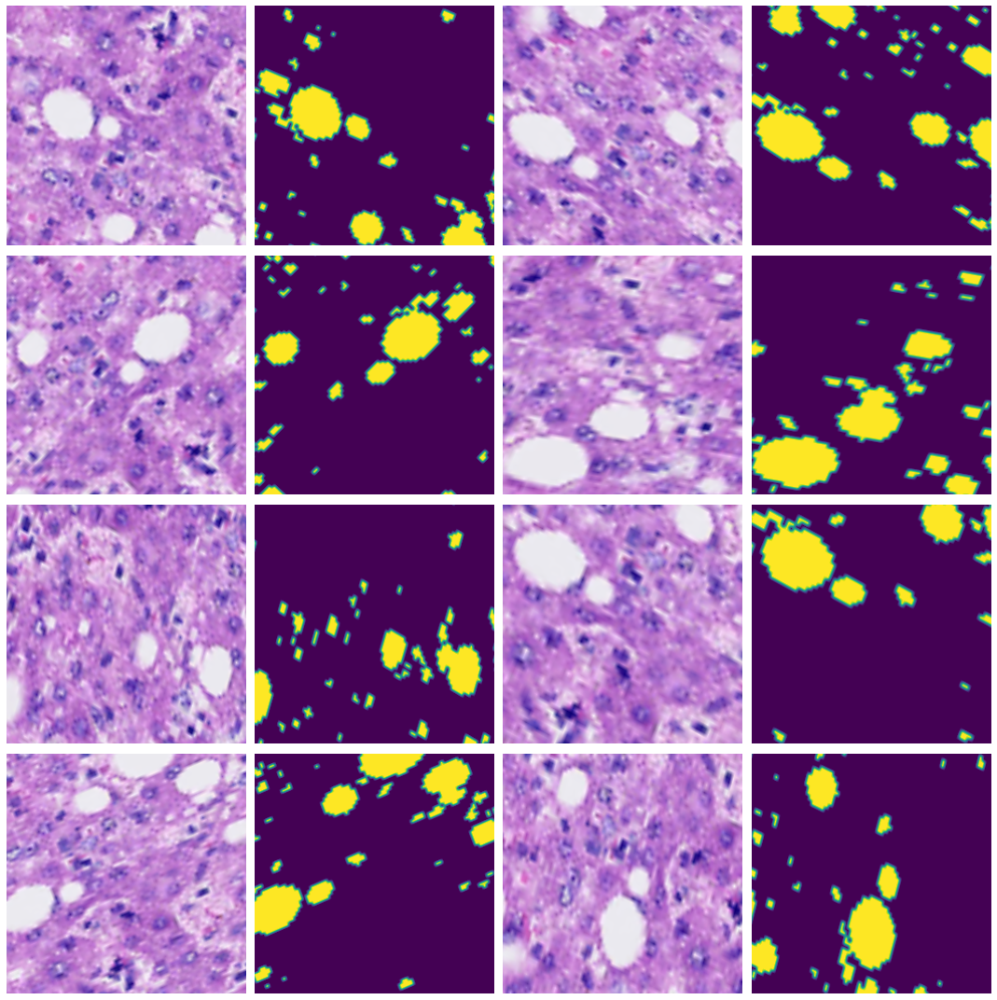

In [91]:
fig,axs = plt.subplots(4,4, figsize=(15,15))
axs = axs.flatten()

img, mask = next(train_iterator)
    
for i in range(8):
    img, mask = next(train_iterator)
    axs[2*i].imshow(img[0])           # yields (256,256,3)
    axs[2*i+1].imshow(mask[0,:,:,0])  # yields the shape of mask (256,256)  
    
for ax in axs:
    ax.axis("off")

plt.tight_layout()

In [92]:
# (batch_size, heigth, width, number_of_channels=depth)
# we have 1 original image with shape 256x256 and 3 channels (RGB)
print(img.shape)  
print(mask.shape)

(1, 256, 256, 3)
(1, 256, 256, 3)


## Manual U-Net Architecture

In [116]:
# function to produce filter sizes to be fed into U-Net
# created separately to tackle list error in Optuna´s visualization tools
def produce_filter_sizes(init):
    """
    Generates filters for the layers of manual U-Net structure
    Parameters
    ---------- 
    init :  int  
        first power of 2 for the first filter     
    
    Returns
    ----------
    filter_sizes : 
        a list that contains 5 filters
    """
    filter_sizes=[]
    # produce 5 filters
    for i in range(5):
        filter_sizes.append(2**init)
        init+=1
    return filter_sizes

produce_filter_sizes(init=4)
# list_of_lists = [produce_filter_sizes(init=i) for i in range(2,8)]
# list_of_lists

[16, 32, 64, 128, 256]

In [117]:
from tensorflow.keras.backend import clear_session
from tensorflow.keras.layers import Conv2D, SeparableConv2D, Conv2DTranspose, MaxPooling2D, UpSampling2D, BatchNormalization, Activation, add
from tensorflow.keras import Model, Input

clear_session()

def get_model(img_size, num_classes, kernel_size, filter_init, strides, activation, batch_norm, krn_init):
    # produce 5 filters, taking the filter_init parameter as the first power of 2 for the first filter
    filter_sizes = produce_filter_sizes(filter_init)
    
    # the input layer determines the image size input into the network
    inputs = Input(shape=img_size + (3,))   # 3 means RGB
    
    ### downsampling

    # entry block
    x = Conv2D(filter_sizes[0], kernel_size=kernel_size, strides=strides, padding="same", kernel_initializer=krn_init)(inputs)
    if batch_norm: x = BatchNormalization()(x)
    x = Activation(activation)(x)

    previous_block_activation = x  # Set aside residual

    # next blocks are identical apart from the feature depth
    for filters in filter_sizes[1:]:

        x = Activation(activation)(x)
        x = SeparableConv2D(filters, kernel_size=kernel_size, padding="same", kernel_initializer=krn_init)(x)
        if batch_norm: x = BatchNormalization()(x)

        x = Activation(activation)(x)
        x = SeparableConv2D(filters, kernel_size=kernel_size, padding="same", kernel_initializer=krn_init)(x)
        if batch_norm: x = BatchNormalization()(x)

        x = MaxPooling2D(3, strides=strides, padding="same")(x) # pool_size=3

        # Project residual
        residual = Conv2D(filters, 1, strides=strides, padding="same", kernel_initializer=krn_init)(
            previous_block_activation
        )
        x = add([x, residual])         # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### upscaling

    for filters in filter_sizes[::-1]:
        x = Activation(activation)(x)
        x = Conv2DTranspose(filters, kernel_size=kernel_size, padding="same", kernel_initializer=krn_init)(x)
        if batch_norm: x = BatchNormalization()(x)

        x = Activation(activation)(x)
        x = Conv2DTranspose(filters, kernel_size=kernel_size, padding="same", kernel_initializer=krn_init)(x)
        if batch_norm: x = BatchNormalization()(x)

        x = UpSampling2D(2)(x)

        # Project residual
        residual = UpSampling2D(2)(previous_block_activation)
        residual = Conv2D(filters, 1, padding="same")(residual)
        x = add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # per-pixel classification layer
    outputs = Conv2D(num_classes, kernel_size=3, activation="sigmoid", padding="same")(x) # softmax

    # create the model
    model = Model(inputs, outputs)
    
    return model


clear_session()
# Build model
model = get_model((256,256), 
                  1,
                  3,
                  5,
                  2,
                  "selu",
                  True,
                  krn_init="glorot_uniform")

# and compile it
model.compile('adam', loss=sm.losses.binary_focal_dice_loss, metrics=[sm.metrics.iou_score])

In [118]:
# build and compile the model with chosen hyperparameters for optimization part
def build_unet_model(img_size=(256,256),
                     num_classes=1,
                     kernel_size=3,
                     filter_init=5,
                     strides=2,
                     activation="selu",
                     batch_norm=True,
                     krn_init="glorot_uniform",
                     optimization=Adam,
                     log_learning_rate=-3,  # -3
                     loss_func=sm.losses.binary_focal_dice_loss):
    
    # get manual U-Net model
    model=get_model(img_size, num_classes, kernel_size, filter_init, strides, activation, batch_norm, krn_init)
    
    # initialize the optimization
    opt = optimization(learning_rate=10**log_learning_rate)
    
    # choose a loss function suited for semantic segmentation
    #loss_func = sm.losses.binary_focal_dice_loss
    
    # compile the model
    model.compile(optimizer=opt, loss=loss_func, metrics=[sm.metrics.iou_score])
    
    return model

In [22]:
model3 = build_unet_model(kernel_size=6)  # check effect of individual prms
model3.evaluate(test_iterator, steps=32)

32/32 [==============================] - 2s 49ms/step - loss: 1.0840 - iou_score: 0.1205


[1.0840320587158203, 0.12050561606884003]

In [23]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 128, 128, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

## Train Model with TensorBoard and Custom Callback for Online Info

In [119]:
# !rm -rf ./logs
# logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")

# tboard_callback = TensorBoard(log_dir = logs,
#                              histogram_freq = 1,
#                              profile_batch = '500,520')

class CustomCallback(Callback):
    def __init__(self, epochs):
        self.epochs = epochs
        
    def on_train_begin(self, logs={}):
        self.x = []
        self.losses = []
        self.val_losses = []
        self.metric = []
        self.val_metric = []
        
        self.samples = 4
        
        img, mask = next(test_iterator)
        
        self.img, self.mask = np.zeros((self.samples, *img.shape[1:])), np.zeros((self.samples, *mask.shape[1:]))
        for i in range(self.samples):
            img, mask = next(test_iterator)
            self.img[i], self.mask[i] = img.reshape(-1,*img.shape), mask.reshape(-1,*mask.shape)
            
        #while self.img.shape[0] < self.samples:
        #    self.img, self.mask = next(test_iterator)
        
        #self.samples = min(self.img.shape[0], 6)
        #print(self.samples)
            

    def on_epoch_end(self, epoch, logs={}):
        self.x.append(epoch)
        self.losses.append(logs["loss"])
        self.val_losses.append(logs["val_loss"])
        self.metric.append(logs["iou_score"])
        self.val_metric.append(logs["val_iou_score"])
        
        epoch_pred = model.predict(self.img.reshape(self.img.shape[0],256,256,3))
        
        clear_output(wait=True)
        
        fig = plt.figure(figsize=(16,16))
        axs = []
        axs.append(fig.add_subplot(2+self.samples,2,1))
        axs.append(fig.add_subplot(2+self.samples,2,2))
        for i in range(self.samples): #self.samples):
            for j in range(6):
                #print(i,j,(2+self.samples)*i+j+2+self.samples+1)
                axs.append(fig.add_subplot(2+self.samples,6,(2+self.samples)*i+j+2+self.samples+1))
    
        fig.suptitle(f"Epoch {epoch+1}", fontsize=24)
        
        axs[0].plot(self.x, self.losses, lw=4, label="loss")
        axs[0].plot(self.x, self.val_losses, lw=4, label="val_loss")
        axs[0].legend(fontsize=16)
        axs[0].set_xlabel("Epoch", fontsize=16)
        axs[0].set_ylabel("Loss", fontsize=16)
        axs[0].set_yscale("log")
        
        axs[1].plot(self.x, self.losses, lw=4, label="iou_score")
        axs[1].plot(self.x, self.val_losses, lw=4, label="val_iou_score")
        axs[1].legend(fontsize=16)
        axs[1].set_xlabel("Epoch", fontsize=16)
        axs[1].set_ylabel("Metric", fontsize=16)
        #axs[1].set_yscale("log")
        
        [axs[k].set_xlim([0,self.epochs-1]) for k in range(2)]
        
        
        # uncomment following when noisy data is used
        titles = ["Image", "Prediction", "Ground Truth", "Pred Overlay", "GT Overlay", "Difference"]

        y_pred_thresh = epoch_pred.copy()
        y_pred_thresh = np.interp(y_pred_thresh, (y_pred_thresh.min(), y_pred_thresh.max()), (0, +1))
        #y_pred_thresh[y_pred_thresh<thresh] = np.nan
        
        #axs[1].hist(y_pred_thresh.flatten(), bins=20, density=True)
        
        x_test_ranged = self.img.copy()
        x_test_ranged = np.interp(x_test_ranged, (x_test_ranged.min(), x_test_ranged.max()), (0, +1)) #(x_test_ranged+1)/2
        
        y_test_ranged = self.mask.copy()
        y_test_ranged = np.interp(y_test_ranged, (y_test_ranged.min(), y_test_ranged.max()), (0, +1)) #(y_test_ranged+1)/2
        #y_test_ranged[y_test_ranged<0.6] = np.nan
            
        #fig,axs = plt.subplots(samples,6, figsize=(16,3*samples))
        
        diff_vals = y_test_ranged[:,:,:,0]-y_pred_thresh[:,:,:,0] #((y_test_ranged-y_pred_thresh)+1)/2
        diff_vals = np.interp(diff_vals, (diff_vals.min(), diff_vals.max()), (0, +1))
        
        for i in range(self.samples):
            axs[2+6*i+0].imshow(x_test_ranged[i])
            axs[2+6*i+1].imshow(y_pred_thresh[i])
            axs[2+6*i+2].imshow(y_test_ranged[i,:,:,0])
            axs[2+6*i+3].imshow(x_test_ranged[i])
            axs[2+6*i+3].imshow(y_pred_thresh[i], alpha=0.5)
            axs[2+6*i+4].imshow(x_test_ranged[i])
            axs[2+6*i+4].imshow(y_test_ranged[i,:,:,0], alpha=0.5)
            axs[2+6*i+5].imshow(diff_vals[i], cmap='Spectral')
            for j in range(6):
                axs[2+6*i+j].axis("off")
                
        for i in range(6):
            axs[2+i].set_title(titles[i], fontsize=15)
        #axs[0,1].set_title("Prediction", fontsize=26)
        #axs[0,2].set_title("Ground Truth", fontsize=26)
        #axs[0,3].set_title("Overlay", fontsize=26)
        plt.tight_layout()
        
        plt.savefig(f"Anim/training_anim_{epoch}.png")
        plt.show()
        
        # place your conditional statement here
        # it should check whether the current loss is below 3.3*10^-3 and then
        # set self.model.stop_training to True
        # you can additionally provide a print() statement
        ### BEGIN SOLUTION
        #if logs["loss"][-1] < 3.3e-3:
        #    print(f"Loss < 3.3e-3, stopping training early at epoch {epoch}")
        #    self.model.stop_training = True
        ### END SOLUTION  

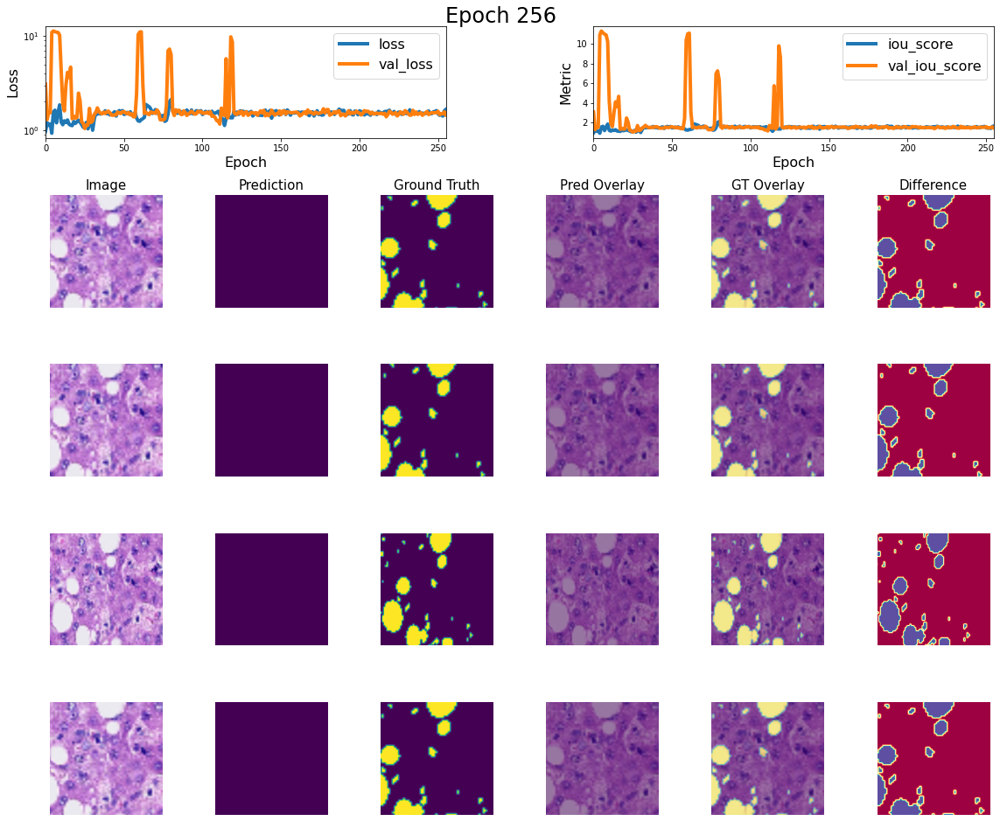

8/8 [==============================] - 3s 360ms/step - loss: 1.6623 - iou_score: 1.0035e-09 - val_loss: 1.4515 - val_iou_score: 1.4869e-09


In [122]:
epochs = 256
batch_size = 8
custom_callback = CustomCallback(epochs)

history = model.fit(train_iterator,
                    validation_data=train_iterator,
                    validation_steps=8,  # 16
                    batch_size=8, 
                    steps_per_epoch=8,  # 64
                    epochs=epochs,
                    #callbacks = [tboard_callback, plot_losses],
                    callbacks=custom_callback,
                    verbose=1)

#plt.savefig("loss_plots_n.pdf")

In [121]:
# Evaluate model
# 0.15-0.19 is the best results I can observe
# very often it is numerical zeros

eval_orig = model.evaluate(test_iterator, steps=16)  # 32
print("Original model, IoU score: {:5.7f}%".format(100*eval_orig[1]))

16/16 [==============================] - 1s 55ms/step - loss: 1.4093 - iou_score: 0.1054
Original model, IoU score: 10.5442785%


## Training History

In [32]:
for i,key in enumerate(history.history.keys()):
    print(key)

loss
iou_score
val_loss
val_iou_score


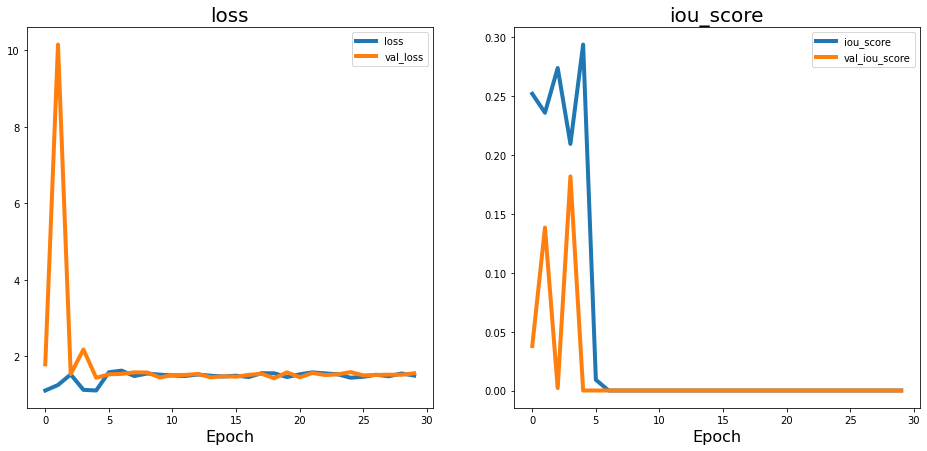

In [33]:
fig,axs = plt.subplots(1,2, figsize=(16,7))

for i,key in enumerate(history.history.keys()):
    axs[i%2].set_title(key[4:], fontsize=20)
    axs[i%2].plot(history.history[key], lw=4, label=key)
    axs[i%2].set_xlabel("Epoch", fontsize=16)
    axs[i%2].legend()

## Save and Load Model

In [ ]:
# only executed when model is promising
model.save("Saved_Model/model_name_1.h5")

In [34]:
from tensorflow.keras.models import load_model

# model2 = load_model("model_name_4.h5", 
#                    custom_objects={"binary_focal_dice_loss": sm.losses.binary_focal_dice_loss, # CHANGED 
#                                    "iou_score": sm.metrics.iou_score}, compile=False)  

model2 = load_model("Saved_Model/model_name_1.h5", compile=False)
model2.compile('adam', loss=sm.losses.binary_focal_dice_loss, metrics=[sm.metrics.iou_score]) 

In [35]:
model2.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 128, 128, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

## Generate new images for testing

In [36]:
samples = 8

test_img, test_mask = np.zeros((8, *img.shape[1:])), np.zeros((8, *mask.shape[1:]))
y_hat_mask = np.zeros((8, 256, 256, 1))

for i in range(8):
    img, mask = next(test_iterator)
    test_img[i], test_mask[i] = img.reshape(-1,*img.shape), mask.reshape(-1, *mask.shape)
    
    y_hat_mask[i] = model2.predict(img)#.reshape(img.shape[0],256,256,3))
    
y_hat_mask.shape
test_mask.shape

(8, 256, 256, 3)

## Evaluate IoU-score on Test Batch

In [37]:
# load a model
eval_load = model2.evaluate(test_iterator, steps=32)#, workers=16, use_multiprocessing=True, verbose=1)

32/32 [==============================] - 2s 54ms/step - loss: 0.3195 - iou_score: 0.5522


In [38]:
print("Loaded model, IoU score: {:5.7f}%".format(100*eval_load[1]))

Loaded model, IoU score: 55.2218199%


In [39]:
model2.get_config()

{'name': 'functional_1',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'name': 'input_1',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv2d',
    'trainable': True,
    'dtype': 'float32',
    'filters': 32,
    'kernel_size': (3, 3),
    'strides': (2, 2),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'linear',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv2d',
   'inbound_nodes': [[['input_1', 0, 0, {}]]]},
  {'class_name': 'BatchNormaliza

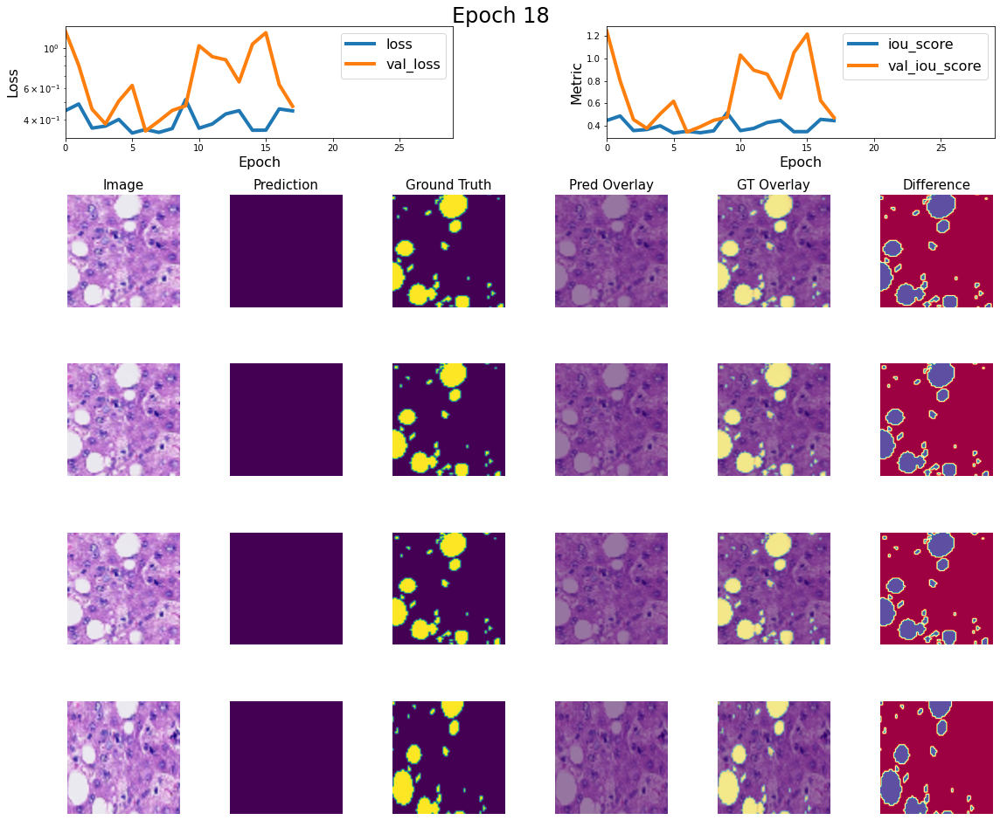

16/16 [==============================] - 4s 231ms/step - loss: 0.4467 - iou_score: 0.5172 - val_loss: 0.4738 - val_iou_score: 0.4725
Epoch 19/30
15/16 [===========================>..] - ETA: 0s - loss: 0.3644 - iou_score: 0.5545

KeyboardInterrupt: 

In [40]:
epochs = 30
batch_size=16
custom_callback = CustomCallback(epochs)

history = model2.fit(train_iterator,
                    validation_data=train_iterator,
                    validation_steps=16,  # 16
                    batch_size=batch_size, 
                    steps_per_epoch=16,  # 64
                    epochs=epochs,
                    #callbacks = [tboard_callback, plot_losses],
                    callbacks=custom_callback,
                    verbose=1)

In [42]:
# re-trained best model

eval_retrain = model2.evaluate(test_iterator, steps=16)  # 32
print("Original model, IoU score: {:5.7f}%".format(100*eval_retrain[1]))

16/16 [==============================] - 1s 50ms/step - loss: 0.4185 - iou_score: 0.4875
Original model, IoU score: 48.7481058%


## Plot Predictions and Compare

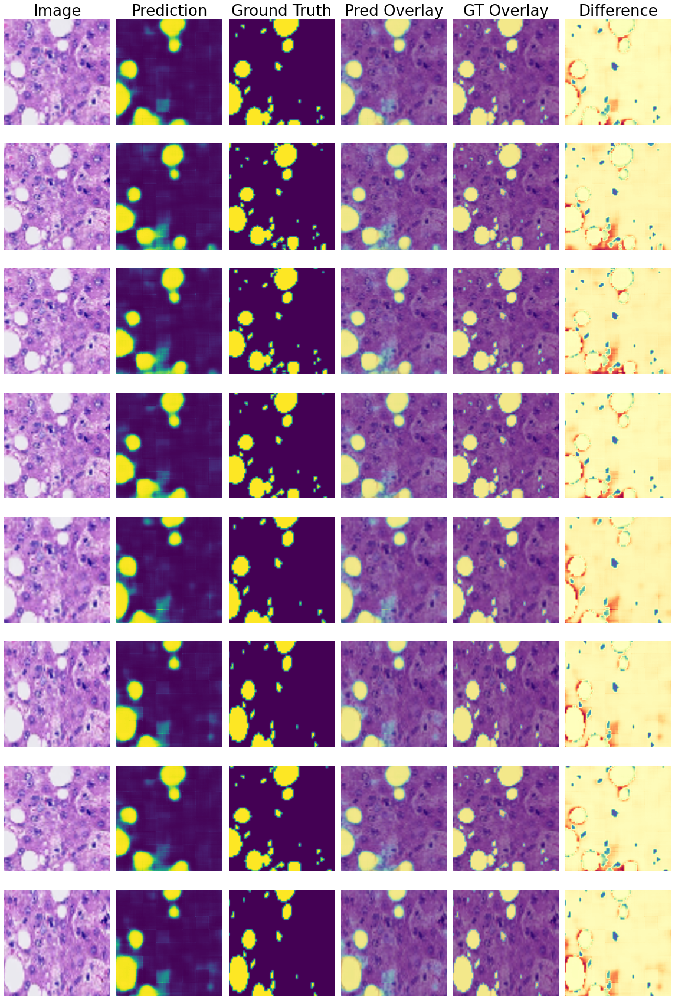

In [43]:
samples = 8 # max batch_size
thresh = 0.9

titles = ["Image", "Prediction", "Ground Truth", "Pred Overlay", "GT Overlay", "Difference"]

y_pred_thresh = y_hat_mask.copy()
#y_pred_thresh[y_pred_thresh<thresh] = np.nan

x_test_ranged = test_img.copy()
#x_test_ranged = (x_test_ranged+1)/2

y_test_ranged = test_mask.copy()
#y_test_ranged = (y_test_ranged+1)/2
#y_test_ranged[y_test_ranged<0.6] = np.nan

diff_vals = y_test_ranged[:,:,:,0]-y_pred_thresh[:,:,:,0] #((y_test_ranged-y_pred_thresh)+1)/2
diff_vals = np.interp(diff_vals, (diff_vals.min(), diff_vals.max()), (0, +1))

fig,axs = plt.subplots(samples,6, figsize=(16,3*samples))


for i in range(samples):
    axs[i,0].imshow(x_test_ranged[i])
    axs[i,1].imshow(y_pred_thresh[i])
    axs[i,2].imshow(y_test_ranged[i,:,:,0])
    axs[i,3].imshow(x_test_ranged[i])
    axs[i,3].imshow(y_pred_thresh[i], alpha=0.5)
    axs[i,4].imshow(x_test_ranged[i])
    axs[i,4].imshow(y_test_ranged[i,:,:,0], alpha=0.5)
    axs[i,5].imshow(diff_vals[i], cmap="Spectral")
    #axs[i,5].imshow(y_pred_thresh[i], alpha=0.5)
    for j in range(6):
        axs[i,j].axis("off")
        
for j in range(6):
    axs[0,j].set_title(titles[j], fontsize=26)
#axs[0,1].set_title("Prediction", fontsize=26)
#axs[0,2].set_title("Ground Truth", fontsize=26)
#axs[0,3].set_title("Overlay", fontsize=26)
plt.tight_layout()

plt.savefig("segmentation_probs.png")

## Segment Whole Image

In [44]:
full_image_datagen = ImageDataGenerator()
full_mask_datagen = ImageDataGenerator()


# fixed RNG seed to make sure images and masks are transformed in the same way
seed = 42
#batch_size = 32

full_image_iterator = full_image_datagen.flow_from_directory("Imgs", 
                                                   class_mode=None, 
                                                   seed=seed)
full_mask_iterator   = full_mask_datagen.flow_from_directory("Masks",
                                                   class_mode=None,
                                                   seed=seed)

full_iterator = zip(full_image_iterator, full_mask_iterator)

Found 1 images belonging to 1 classes.
Found 1 images belonging to 1 classes.


In [45]:
full_gen = (pair for pair in zip(full_image_iterator, full_mask_iterator)) # CHANGED added

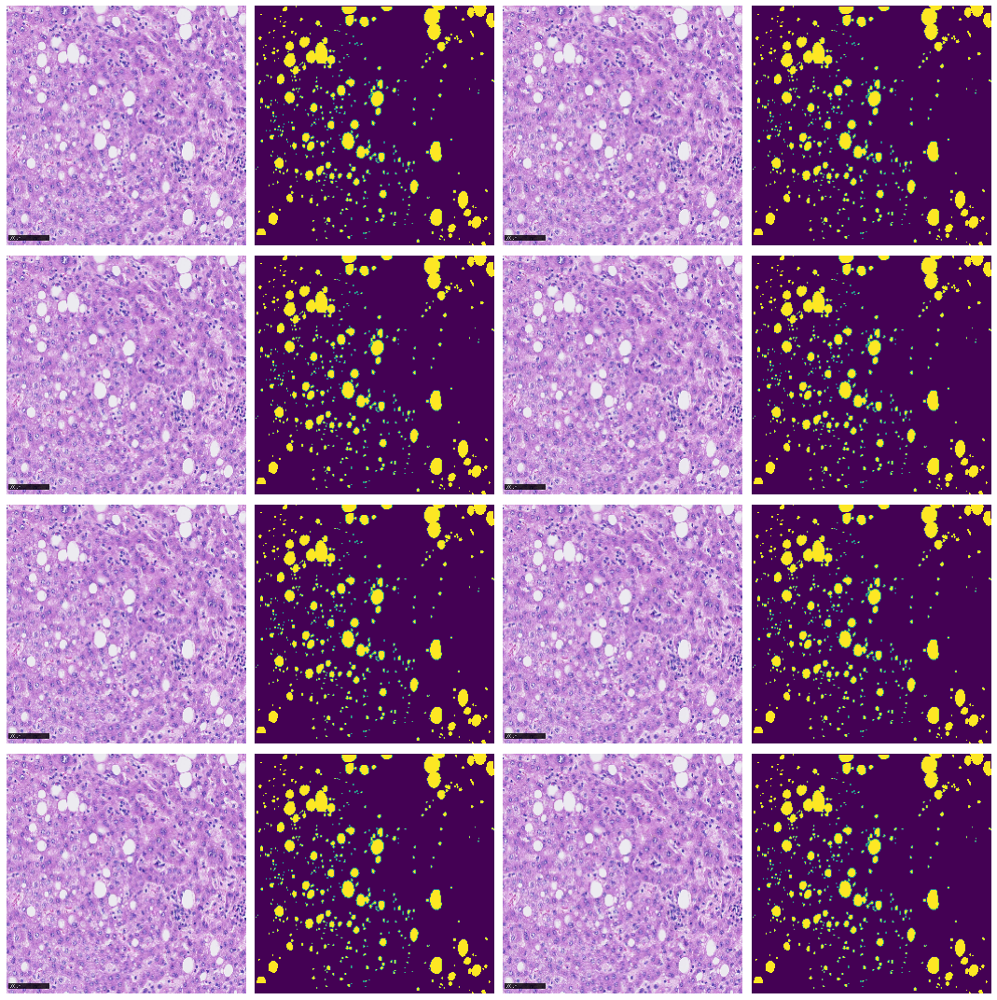

In [46]:
fig,axs = plt.subplots(4,4, figsize=(15,15))
axs = axs.flatten()

full_img, full_mask = next(full_iterator)
full_img = preprocess_input(full_img)
full_mask = preprocess_input(full_mask)


for i in range(8):
    #axs[2*i].imshow(full_img[i])
    #axs[2*i+1].imshow(full_mask[i,:,:,i])
    axs[2*i].imshow(full_img[0])
    axs[2*i+1].imshow(full_mask[0,:,:,0])
    
for ax in axs:
    ax.axis("off")

plt.tight_layout()

In [47]:
print("Max value of normalized image: ", full_mask[0].max())
print("Min value of normalized image: ", full_mask[0].min())
print("Shape of normalized image: ", full_img[0].shape)

Max value of normalized image:  1.0
Min value of normalized image:  0.0
Shape of normalized image:  (256, 256, 3)


In [48]:
y_full_pred = model2.predict(full_img)

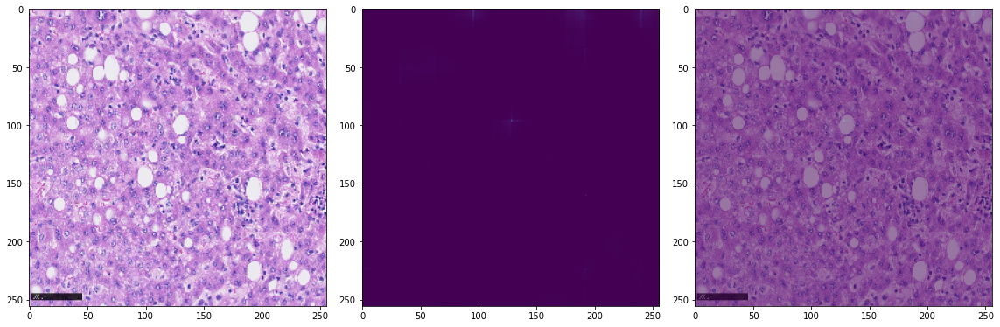

In [49]:
fig,axs = plt.subplots(1,3, figsize=(16,7))

sample = 0

axs[0].imshow(full_img[sample])
axs[1].imshow(y_full_pred[sample])
axs[2].imshow(full_img[sample])
axs[2].imshow(y_full_pred[sample], alpha=0.5)

#for ax in axs:
#    ax.axis("off")
plt.tight_layout()

### Load Full Image Manually

In [50]:
from PIL import Image
from skimage.transform import resize

### helper function for full predictions
def predict_full(sample, slice_size, threshold=0.1, savefig=False):
    t_image = preprocess_input(np.asarray(Image.open(f'Imgs/img/J-19-0153-{sample}_HE.jpg')))
    t_mask  = preprocess_input(np.asarray(Image.open(f'Masks/img/J-19-0153-{sample}_mask_HE.png')))#.convert('L')))
    
    x_step = t_image.shape[0]//slice_size
    y_step = t_image.shape[1]//slice_size

    full_slices = []
    
    for i in range(x_step):
        for j in range(y_step):
            full_slices.append(t_image[i*slice_size:(i+1)*slice_size,j*slice_size:(j+1)*slice_size])
            
    full_slices = np.array(full_slices)
    
    full_slices_resized = resize(full_slices, (full_slices.shape[0],256,256,3))
    
    slice_preds = model2.predict(full_slices_resized)
    
    slice_preds_resized = resize(slice_preds, (slice_preds.shape[0],slice_size,slice_size,3))
    
    full_pred = np.zeros((x_step*slice_size, y_step*slice_size))
    
    k = 0
    
    for i in range(x_step):
        for j in range(y_step):
            full_pred[i*slice_size:(i+1)*slice_size,j*slice_size:(j+1)*slice_size] = slice_preds_resized[k,:,:,0]
            k += 1
            
    titles = ["Image", "Prediction", "Ground Truth", "Image + Pred", "Image + GT", "GT - Pred"]
    
    fig,axs = plt.subplots(2,3, figsize=(16,9))
    
    t_image_rescaled = (t_image+1)/2
    full_pred_thresh = full_pred.copy()
    full_pred_thresh = (full_pred_thresh+1)/2
    full_pred_thresh[full_pred_thresh<threshold] = 0.0
    
    
    t_mask_resized = (t_mask[:x_step*slice_size,:y_step*slice_size]+1)/2
    
    axs[0,0].imshow(t_image_rescaled)
    axs[0,1].imshow(full_pred_thresh)
    axs[0,2].imshow(t_mask_resized)
    
    axs[1,0].imshow(t_image_rescaled)
    axs[1,0].imshow(full_pred_thresh, alpha=0.5)
    axs[1,1].imshow(t_image_rescaled)
    axs[1,1].imshow(t_mask_resized, alpha=0.3)
    #axs[1,2].imshow((t_mask+1)/2)
    #axs[1,2].imshow((full_pred_thresh+1)/2, alpha=0.5)
    axs[1,2].imshow(t_mask_resized - full_pred_thresh, cmap="Spectral")
    
    axs = axs.flatten()
    for i,ax in enumerate(axs):
        ax.set_title(titles[i], fontsize=20)
        ax.axis("off")
        
    plt.tight_layout()
    
    if savefig:
        plt.savefig(f"full_prediction_{sample}_{slice_size}x{slice_size}_{threshold}.png")

## Predict for all images in the folder

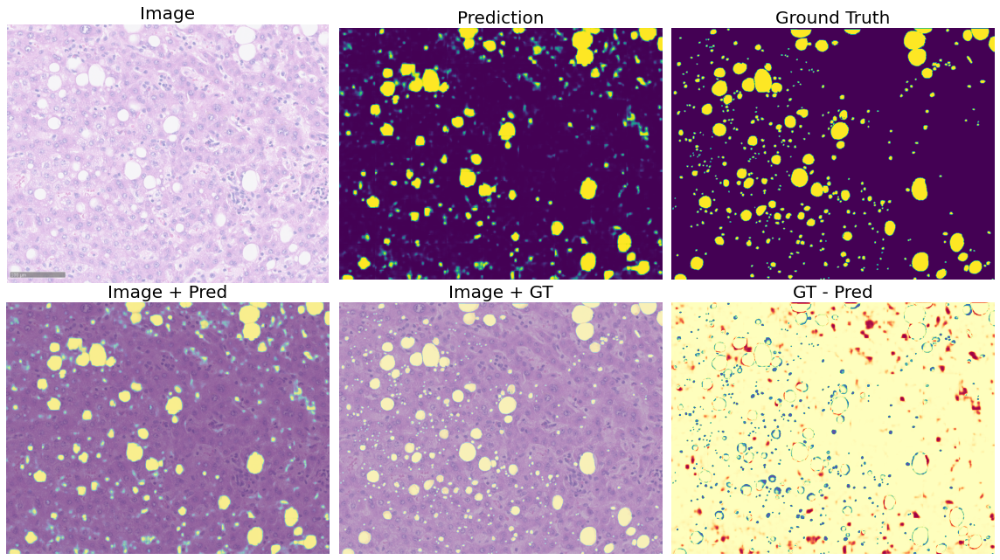

In [51]:
for num in ["10"]:#["01", "02", "03", "04", "05", "06", "07", "08", "09", "10"]:
    # filename modifier, crop size, threshold that counts as detection, save all figures in files
    predict_full(num, 140, 0.1, False)

## Optuna

In [52]:
import optuna

* Changed build_unet_model() function to "get_model() and model.compile"

In [53]:
# define the objective funtion to be optimized 
# this will be the iou_score
def objective(trial):

    clear_session()

    # define hyperparameter space to be optimized    
    # learning rates
    lr = trial.suggest_float("learning rate", 1e-5, 1e-1, log=True)
    
    # activation functions
    af = trial.suggest_categorical("activation  ", 
                                   ["tanh", 
                                    "selu", 
                                    "relu", 
                                    "sigmoid"])
    
    # kernel sizes
    ks = trial.suggest_int("kernel size  ", 1, 8)
    
    # filter sizes (initial power to be applied to 2 for each filter)
    fs = trial.suggest_int("filter power", 3, 5)
    
    # kernel intiialization
    ki = trial.suggest_categorical("kernel init  ", 
                                   ["he_normal", 
                                    "glorot_uniform", 
                                    "he_uniform", 
                                    "glorot_normal"])

    # get model architecture and compile 
    # while passing the hyperparameter space as an argument
    model = get_model(img_size=(256,256), 
                      num_classes=1,
                      kernel_size=ks,
                      filter_init=fs,
                      strides=2,
                      activation=af,
                      batch_norm=True,
                      krn_init=ki)
    
    model.compile(Adam(lr=lr), 
                  loss=sm.losses.binary_focal_jaccard_loss, 
                  metrics=sm.metrics.iou_score)
    
    # train model
    model.fit(train_iterator,
              validation_data=train_iterator,
              validation_steps=16,
              batch_size=16,
              steps_per_epoch=16,
              epochs=256,
              verbose=1)

    # evaluate model on the test set
    score = model.evaluate(test_gen, steps=32, verbose=0)

    # the second element is the iou_score
    return score[1]

In [54]:
if __name__ == "__main__":

    load_existing_study = True
    
    study_name = "U-Net-study-bilge"  # unique identifier of the study
    storage_name = "sqlite:///{}.db".format(study_name)  # save study with this name
    
    if load_existing_study:
        # just load the finished results
        study = optuna.load_study(study_name=study_name, storage=storage_name)

        # uncomment to resume loaded study
        # study.optimize(objective, n_trials=5) # timeout=600

    else:        
        # delete existing study object and create new one
        # optuna.delete_study(study_name=study_name, storage=storage_name)

        # set load_if_exists=True to be able to resume later
        study = optuna.create_study(direction="maximize", study_name=study_name, storage=storage_name, load_if_exists=True)        

        # start optimization
        study.optimize(objective, n_trials=5) # timeout=600

    print("Number of finished trials: {}".format(len(study.trials)))

    print("Best trial:")
    trial = study.best_trial

    print("  IoU Score: {}".format(trial.value))

    print("  Parameters: ")
    for key, value in trial.params.items():
        print("    {}\t \t: {}".format(key, value))

Number of finished trials: 10
Best trial:
  IoU Score: 0.7284609079360962
  Parameters: 
    activation  	 	: selu
    filter power	 	: 5
    kernel init  	 	: he_normal
    kernel size  	 	: 4
    learning rate	 	: 0.0002104702008587422


In [55]:
# get a Pandas dataframe of hyperparameters and IoU Score from all trials
df = study.trials_dataframe(attrs=("number", "value", "params", "state"))
df

,number,value,params_activation,params_filter power,params_kernel init,params_kernel size,params_learning rate,state
0,0,9.319894e-02,tanh,4,glorot_uniform,3,0.065070,COMPLETE
1,1,2.030581e-01,relu,4,he_uniform,6,0.005048,COMPLETE
2,2,6.483853e-01,tanh,3,glorot_normal,2,0.001035,COMPLETE
3,3,4.571482e-01,selu,3,glorot_normal,8,0.001030,COMPLETE
4,4,7.284609e-01,selu,5,he_normal,4,0.000210,COMPLETE
5,5,2.199003e-01,tanh,5,he_normal,5,0.010565,COMPLETE
6,6,1.324972e-01,relu,5,glorot_uniform,6,0.020341,COMPLETE
7,7,1.060027e-09,relu,5,he_uniform,6,0.000270,COMPLETE
8,8,1.107162e-02,relu,5,he_uniform,5,0.014414,COMPLETE
9,9,6.676353e-01,selu,5,glorot_uniform,2,0.000013,COMPLETE


In [56]:
#print("Best params: ", study.best_params)
print("Best value: ", study.best_value)
#print("Best Trial: ", study.best_trial)
#print("Trials: ", study.trials)

Best value:  0.7284609079360962


In [57]:
# train model again with best hyperparameters
best_model = objective(study.best_trial)

Epoch 1/256
16/16 [==============================] - 2s 139ms/step - loss: 1.4250 - iou_score: 0.2218 - val_loss: 8.9887 - val_iou_score: 0.1128
Epoch 2/256
16/16 [==============================] - 2s 109ms/step - loss: 1.2775 - iou_score: 0.1893 - val_loss: 2.5531 - val_iou_score: 0.1406
Epoch 3/256
16/16 [==============================] - 2s 111ms/step - loss: 1.2038 - iou_score: 0.2650 - val_loss: 2.3582 - val_iou_score: 0.1744
Epoch 4/256
16/16 [==============================] - 2s 114ms/step - loss: 1.2731 - iou_score: 0.2448 - val_loss: 2.6615 - val_iou_score: 0.2066
Epoch 5/256
16/16 [==============================] - 2s 105ms/step - loss: 1.1448 - iou_score: 0.3678 - val_loss: 4.0337 - val_iou_score: 0.1489
Epoch 6/256
16/16 [==============================] - 2s 113ms/step - loss: 1.1881 - iou_score: 0.3307 - val_loss: 2.9453 - val_iou_score: 0.1609
Epoch 7/256
16/16 [==============================] - 2s 112ms/step - loss: 1.0980 - iou_score: 0.3568 - val_loss: 8.6050 - val_iou

16/16 [==============================] - 2s 109ms/step - loss: 0.4367 - iou_score: 0.6233 - val_loss: 0.4770 - val_iou_score: 0.5882
Epoch 114/256
16/16 [==============================] - 2s 106ms/step - loss: 0.4528 - iou_score: 0.6068 - val_loss: 0.4898 - val_iou_score: 0.5842
Epoch 115/256
16/16 [==============================] - 2s 105ms/step - loss: 0.4385 - iou_score: 0.6228 - val_loss: 0.6143 - val_iou_score: 0.4823
Epoch 116/256
16/16 [==============================] - 2s 106ms/step - loss: 0.4633 - iou_score: 0.5946 - val_loss: 0.4574 - val_iou_score: 0.6057
Epoch 117/256
16/16 [==============================] - 2s 105ms/step - loss: 0.5378 - iou_score: 0.5210 - val_loss: 0.5107 - val_iou_score: 0.5522
Epoch 118/256
16/16 [==============================] - 2s 109ms/step - loss: 0.4739 - iou_score: 0.5839 - val_loss: 0.4708 - val_iou_score: 0.5967
Epoch 119/256
16/16 [==============================] - 2s 113ms/step - loss: 0.4542 - iou_score: 0.6031 - val_loss: 0.4539 - val_iou

Epoch 169/256
16/16 [==============================] - 2s 110ms/step - loss: 0.4206 - iou_score: 0.6347 - val_loss: 0.6304 - val_iou_score: 0.4763
Epoch 170/256
16/16 [==============================] - 2s 113ms/step - loss: 0.4542 - iou_score: 0.6021 - val_loss: 0.4325 - val_iou_score: 0.6299
Epoch 171/256
16/16 [==============================] - 2s 113ms/step - loss: 0.4418 - iou_score: 0.6164 - val_loss: 0.4353 - val_iou_score: 0.6297
Epoch 172/256
16/16 [==============================] - 2s 108ms/step - loss: 0.4439 - iou_score: 0.6127 - val_loss: 0.4479 - val_iou_score: 0.6212
Epoch 173/256
16/16 [==============================] - 2s 112ms/step - loss: 0.4521 - iou_score: 0.6026 - val_loss: 0.4744 - val_iou_score: 0.6027
Epoch 174/256
16/16 [==============================] - 2s 109ms/step - loss: 0.4789 - iou_score: 0.5803 - val_loss: 0.4867 - val_iou_score: 0.5889
Epoch 175/256
16/16 [==============================] - 2s 108ms/step - loss: 0.4009 - iou_score: 0.6555 - val_loss: 0.

Epoch 225/256
16/16 [==============================] - 2s 112ms/step - loss: 0.4059 - iou_score: 0.6487 - val_loss: 0.4519 - val_iou_score: 0.6068
Epoch 226/256
16/16 [==============================] - 2s 109ms/step - loss: 0.3741 - iou_score: 0.6748 - val_loss: 0.4249 - val_iou_score: 0.6359
Epoch 227/256
16/16 [==============================] - 2s 115ms/step - loss: 0.3875 - iou_score: 0.6659 - val_loss: 0.4642 - val_iou_score: 0.5929
Epoch 228/256
16/16 [==============================] - 2s 112ms/step - loss: 0.4077 - iou_score: 0.6469 - val_loss: 0.4167 - val_iou_score: 0.6421
Epoch 229/256
16/16 [==============================] - 2s 111ms/step - loss: 0.3976 - iou_score: 0.6513 - val_loss: 0.4139 - val_iou_score: 0.6377
Epoch 230/256
16/16 [==============================] - 2s 106ms/step - loss: 0.4210 - iou_score: 0.6344 - val_loss: 0.4313 - val_iou_score: 0.6170
Epoch 231/256
16/16 [==============================] - 2s 112ms/step - loss: 0.4140 - iou_score: 0.6405 - val_loss: 0.

In [59]:
# IoU score re-evaluated
print(best_model)

0.6996303796768188


## Visualization

In [60]:
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_contour
from optuna.visualization import plot_slice
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_edf

In [61]:
plot_optimization_history(study)

In [62]:
plot_parallel_coordinate(study)

In [63]:
# select parameters to visualize
plot_parallel_coordinate(study, params=["learning rate", "activation  "])

# all
#plot_parallel_coordinate(study, params=["learning rate", "activation  ", "kernel size  ", "kernel init  ", "filter sizes"])

### overwrite optuna´s color scheme

In [64]:
import enum

class StudyDirection(enum.Enum):
    """Direction of a :class:`~optuna.study.Study`.

    Attributes:
        NOT_SET:
            Direction has not been set.
        MINIMIZE:
            :class:`~optuna.study.Study` minimizes the objective function.
        MAXIMIZE:
            :class:`~optuna.study.Study` maximizes the objective function.
    """

    NOT_SET = 0
    MINIMIZE = 1
    MAXIMIZE = 2

import math
from typing import Any
from typing import Callable
from typing import Dict
from typing import List
from typing import Optional
from typing import Tuple

from packaging import version

from optuna.logging import get_logger
from optuna.study import Study
# from optuna.study._study_direction import StudyDirection
from optuna.trial import FrozenTrial
from optuna.trial import TrialState
from optuna.visualization._plotly_imports import _imports
from optuna.visualization._utils import _check_plot_args
from optuna.visualization._utils import _is_log_scale
from optuna.visualization._utils import _is_numerical


if _imports.is_successful():
    from optuna.visualization._plotly_imports import Contour
    from optuna.visualization._plotly_imports import go
    from optuna.visualization._plotly_imports import make_subplots
    from optuna.visualization._plotly_imports import plotly
    from optuna.visualization._plotly_imports import Scatter

_logger = get_logger(__name__)


def plot_contour(
    study: Study,
    params: Optional[List[str]] = None,
    *,
    target: Optional[Callable[[FrozenTrial], float]] = None,
    target_name: str = "Objective Value",
) -> "go.Figure":
    _imports.check()
    _check_plot_args(study, target, target_name)
    return _get_contour_plot(study, params, target, target_name)


def _get_param_values(trials: List[FrozenTrial], p_name: str) -> List[Any]:
    values = [t.params[p_name] for t in trials if p_name in t.params]
    if _is_numerical(trials, p_name):
        return values
    return list(map(str, values))


def _get_contour_plot(
    study: Study,
    params: Optional[List[str]] = None,
    target: Optional[Callable[[FrozenTrial], float]] = None,
    target_name: str = "Objective Value",
) -> "go.Figure":

    layout = go.Layout(title="Contour Plot")

    trials = [trial for trial in study.trials if trial.state == TrialState.COMPLETE]

    if len(trials) == 0:
        _logger.warning("Your study does not have any completed trials.")
        return go.Figure(data=[], layout=layout)

    all_params = {p_name for t in trials for p_name in t.params.keys()}
    if params is None:
        sorted_params = sorted(all_params)
    elif len(params) <= 1:
        _logger.warning("The length of params must be greater than 1.")
        return go.Figure(data=[], layout=layout)
    else:
        for input_p_name in params:
            if input_p_name not in all_params:
                raise ValueError("Parameter {} does not exist in your study.".format(input_p_name))
        sorted_params = sorted(set(params))

    padding_ratio = 0.05
    param_values_range = {}
    for p_name in sorted_params:
        values = _get_param_values(trials, p_name)

        min_value = min(values)
        max_value = max(values)

        if _is_log_scale(trials, p_name):
            padding = (math.log10(max_value) - math.log10(min_value)) * padding_ratio
            min_value = math.pow(10, math.log10(min_value) - padding)
            max_value = math.pow(10, math.log10(max_value) + padding)

        elif _is_numerical(trials, p_name):
            padding = (max_value - min_value) * padding_ratio
            min_value = min_value - padding
            max_value = max_value + padding

        else:
            # Plotly>=4.12.0 draws contours using the indices of categorical variables instead of
            # raw values and the range should be updated based on the cardinality of categorical
            # variables. See https://github.com/optuna/optuna/issues/1967.
            if version.parse(plotly.__version__) >= version.parse("4.12.0"):
                span = len(set(values)) - 1
                padding = span * padding_ratio
                min_value = -padding
                max_value = span + padding

        param_values_range[p_name] = (min_value, max_value)

    if len(sorted_params) == 2:
        x_param = sorted_params[0]
        y_param = sorted_params[1]
        sub_plots = _generate_contour_subplot(
            trials, x_param, y_param, study.directions[0], param_values_range, target, target_name
        )
        figure = go.Figure(data=sub_plots, layout=layout)
        figure.update_xaxes(title_text=x_param, range=param_values_range[x_param])
        figure.update_yaxes(title_text=y_param, range=param_values_range[y_param])

        if not _is_numerical(trials, x_param):
            figure.update_xaxes(type="category")
        if not _is_numerical(trials, y_param):
            figure.update_yaxes(type="category")

        if _is_log_scale(trials, x_param):
            log_range = [math.log10(p) for p in param_values_range[x_param]]
            figure.update_xaxes(range=log_range, type="log")
        if _is_log_scale(trials, y_param):
            log_range = [math.log10(p) for p in param_values_range[y_param]]
            figure.update_yaxes(range=log_range, type="log")
    else:
        figure = make_subplots(
            rows=len(sorted_params), cols=len(sorted_params), shared_xaxes=True, shared_yaxes=True
        )
        figure.update_layout(layout)
        showscale = True  # showscale option only needs to be specified once
        for x_i, x_param in enumerate(sorted_params):
            for y_i, y_param in enumerate(sorted_params):
                if x_param == y_param:
                    figure.add_trace(go.Scatter(), row=y_i + 1, col=x_i + 1)
                else:
                    sub_plots = _generate_contour_subplot(
                        trials,
                        x_param,
                        y_param,
                        study.directions[0],
                        param_values_range,
                        target,
                        target_name,
                    )
                    contour = sub_plots[0]
                    scatter = sub_plots[1]
                    contour.update(showscale=showscale)  # showscale's default is True
                    if showscale:
                        showscale = False
                    figure.add_trace(contour, row=y_i + 1, col=x_i + 1)
                    figure.add_trace(scatter, row=y_i + 1, col=x_i + 1)

                figure.update_xaxes(range=param_values_range[x_param], row=y_i + 1, col=x_i + 1)
                figure.update_yaxes(range=param_values_range[y_param], row=y_i + 1, col=x_i + 1)

                if not _is_numerical(trials, x_param):
                    figure.update_xaxes(type="category", row=y_i + 1, col=x_i + 1)
                if not _is_numerical(trials, y_param):
                    figure.update_yaxes(type="category", row=y_i + 1, col=x_i + 1)

                if _is_log_scale(trials, x_param):
                    log_range = [math.log10(p) for p in param_values_range[x_param]]
                    figure.update_xaxes(range=log_range, type="log", row=y_i + 1, col=x_i + 1)
                if _is_log_scale(trials, y_param):
                    log_range = [math.log10(p) for p in param_values_range[y_param]]
                    figure.update_yaxes(range=log_range, type="log", row=y_i + 1, col=x_i + 1)

                if x_i == 0:
                    figure.update_yaxes(title_text=y_param, row=y_i + 1, col=x_i + 1)
                if y_i == len(sorted_params) - 1:
                    figure.update_xaxes(title_text=x_param, row=y_i + 1, col=x_i + 1)

    return figure


def _generate_contour_subplot(
    trials: List[FrozenTrial],
    x_param: str,
    y_param: str,
    direction: StudyDirection,
    param_values_range: Optional[Dict[str, Tuple[float, float]]] = None,
    target: Optional[Callable[[FrozenTrial], float]] = None,
    target_name: str = "Objective Value",
) -> Tuple["Contour", "Scatter"]:

    if param_values_range is None:
        param_values_range = {}

    x_indices = sorted(set(_get_param_values(trials, x_param)))
    y_indices = sorted(set(_get_param_values(trials, y_param)))
    if len(x_indices) < 2:
        _logger.warning("Param {} unique value length is less than 2.".format(x_param))
        return go.Contour(), go.Scatter()
    if len(y_indices) < 2:
        _logger.warning("Param {} unique value length is less than 2.".format(y_param))
        return go.Contour(), go.Scatter()

    # Padding to the plot for non-categorical params.
    x_range = param_values_range[x_param]
    if _is_numerical(trials, x_param):
        x_indices = [x_range[0]] + x_indices + [x_range[1]]

    y_range = param_values_range[y_param]
    if _is_numerical(trials, y_param):
        y_indices = [y_range[0]] + y_indices + [y_range[1]]

    z = [[float("nan") for _ in range(len(x_indices))] for _ in range(len(y_indices))]

    x_values = []
    y_values = []
    for trial in trials:
        if x_param not in trial.params or y_param not in trial.params:
            continue
        x_value = trial.params[x_param]
        y_value = trial.params[y_param]
        if not _is_numerical(trials, x_param):
            x_value = str(x_value)
        if not _is_numerical(trials, y_param):
            y_value = str(y_value)
        x_values.append(x_value)
        y_values.append(y_value)
        x_i = x_indices.index(x_value)
        y_i = y_indices.index(y_value)

        if target is None:
            value = trial.value
        else:
            value = target(trial)

        if isinstance(value, int):
            value = float(value)
        elif not isinstance(value, float):
            raise ValueError(
                f"Trial{trial.number} has COMPLETE state, but its target value is non-numeric."
            )
        z[y_i][x_i] = value

    contour = go.Contour(
        x=x_indices,
        y=y_indices,
        z=z,
        colorbar={"title": target_name},
        colorscale=plotly.colors.PLOTLY_SCALES["Blues"],
        connectgaps=True,
        contours_coloring="heatmap",
        hoverinfo="none",
        line_smoothing=1.3,
        reversescale=target is None and direction == StudyDirection.MINIMIZE,
    )

    scatter = go.Scatter(
        x=x_values,
        y=y_values,
        marker={"line": {"width": 0.2, "color": "Grey"}, "color": "orange"},
        mode="markers",
        showlegend=False,
    )

    return (contour, scatter)

In [65]:
plot_contour(study)

In [66]:
# select parameters
plot_contour(study, params=["kernel size  ", "activation  "])

In [67]:
plot_slice(study)

In [68]:
plot_param_importances(study)

In [69]:
plot_edf(study)